In [1]:
# for getting metabase question
import os
import sys
os.environ["FERNET_KEY"] = "hZKy6btwrDyFwpfnZX7H5o25QebMTze7uYIWvQzwH_Y="
os.environ["MB_DB_URL"] = "gAAAAABmBUgLTCb0w62-C1XKGurLISMIZeeCoryRYSuhu7sqyQPJrPGPioVhj8usN1Z2FzMiHDmiFJ8E6yVXgoJeegfIuKyxmHG1KOaIegAbEX3cZ8lw6s07njv3HY5S_Yu1ggID78P9YTGyKckGb9XYtqE0gmOXcHuH-UXOWcQ2wCV8GjMchUaerYXsXHDUQw8jtVk3ZN_KOnPKOtHdvTjaNnKLa61F1T-rjoOLDqdPFroNlnpNQThC7jPaRMtiQk0RKtzyY8mq"
sys.path.append("/home/ops/app/jupyterhub/common")

In [2]:
import pandas as pd
import numpy as np
import re
import string
import matplotlib.pyplot as plt
import plotly.express as px
import PIL.Image

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, STOPWORDS
from metabase import get_df_from_question

In [3]:
# Get Dataset
dataset = get_df_from_question(50065)

In [4]:
dataset.head()

,complaint_id,complaint_type,complaint_priority,category,sub_category,source_app,description,level_complaint,streamline
0,CX/TP/00089,Request,None,Aplikasi,None,Toko Budidaya,Persiapan media aplikasi probiotik,1,Upstream
1,CX/TP/02351,Request,None,End Customer,None,QR,testttttttttttttttttttttttttttttttt,1,Upstream
2,CX/TP/08531,Request,None,End Customer,None,QR,"Saya belum dapat sales nya ,apakah bisa di ban...",1,Upstream
3,CX/TS/01257,Suggestion,None,End Customer,None,QR,Saran untuk testing,1,Upstream
4,CX/TP/00137,Request,None,Beli Ikan,None,Toko Budidaya,Sya ingin melihat filmnya bokep,1,Downstream


In [5]:
# Regex pattern to match valid Indonesian words (alphabetic and hyphen)
VALID_PATTERN = re.compile(r'^[a-zA-Z\-]+$')

# Regex pattern to match words with double or triple identical adjacent letters
DOUBLE_TRIPLE_PATTERN = re.compile(r'(.)\1{1,2}')

# Step 0: Combine all text from all rows into one big text
def combine_text(df, text_column):
    return ' '.join(df[text_column])

# Step 1: Clean symbols in sentences
def clean_symbols(text):
    text = re.sub(f"[{re.escape(string.punctuation)}]", " ", text)
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'https?:\/\/\S*', ' ', text, flags=re.MULTILINE)
    text = re.sub('[^a-zA-Z]', ' ', text)
    return text

# Step 2: Make sentences lowercase
def to_lowercase(text):
    return text.lower()

# Step 3: Tokenization process
def tokenize(text):
    return word_tokenize(text)

# Step 4: Remove common words in Indonesian
def remove_stopwords(tokens):
    more_stopword = ['dengan', 'ia','bahwa','oleh', 'alamat', 'no', 'telp', 
                     'notelp', 'noto', 'wa', 'nama', 'jl', 'cara', 'kota', 'karna',
                     'januari', 'februari', 'maret', 'april', 'mei', 'juni','juli', 'agustus',
                     'september', 'oktober', 'november', 'desember','mohon','bantu','kasih','format','dibantu','jumat']
    
    stop_words = set(stopwords.words('indonesian') + more_stopword)
    # stop_words = stop_words+more_stopword

    common_names = set([
    'agus', 'andi', 'budi', 'cahyo', 'dedi', 'edi', 'farid', 'gina', 'hadi',
    'iwan', 'joko', 'kiki', 'lisa', 'mira', 'nina', 'oko', 'putri', 'ratna', 
    'sari', 'tini', 'usman', 'vina', 'wawan', 'yani', 'zain', 'indra', 'ikhsan',
    'praja', 'prayitno', 'adi', 'nanda', 'adnan'])

    indonesian_cities = set([
    'jakarta', 'bandung', 'surabaya', 'medan', 'bekasi', 'tangerang', 
    'depok', 'semarang', 'palembang', 'makassar', 'bogor', 'malang', 
    'gresik', 'jatiasih', 'cikampek', 'karawang'])
    
    return [word for word in tokens if word not in stop_words
                                        and word not in common_names
                                        and word not in indonesian_cities]

# Step 5: Apply stemming and lemmatization
def stem_and_lemmatize(tokens):
    factory = StemmerFactory()
    stemmer = factory.create_stemmer()
    return [stemmer.stem(word) for word in tokens]

# Step 6: Remove invalid words using regex
def remove_invalid_words(tokens):
    # Remove words that do not match valid pattern or contain double/triple identical letters
    return [
        word for word in tokens
        if len(word) > 3 and VALID_PATTERN.match(word)
        and not DOUBLE_TRIPLE_PATTERN.search(word)
    ]

# Step 7: Combine all clean words into sentences and combine them into a list
def tokens_to_sentence(tokens):
    return ' '.join(tokens)

# Step 8: Create a count vector to calculate the frequency of each word in the big text with N-grams
def count_vectorize(text, ngram_range=(1, 2)):
    vectorizer = CountVectorizer(ngram_range=ngram_range)
    X = vectorizer.fit_transform([text])
    return X, vectorizer.get_feature_names_out()

In [6]:
def word_frequencies(dataset, column, type, n_gram):
    big_text = combine_text(dataset, column)

    # Step 1
    clean_text = clean_symbols(big_text)
    
    # Step 2
    clean_text = to_lowercase(clean_text)
    
    # Step 3
    tokens = tokenize(clean_text)
    
    # Step 4
    tokens = remove_stopwords(tokens)
    
    # Step 5
    tokens = stem_and_lemmatize(tokens)
    
    # Step 6
    tokens = remove_invalid_words(tokens)
        
    # Step 7
    clean_sentence = tokens_to_sentence(tokens)
    
    # Step 8
    count_vector, feature_names = count_vectorize(clean_sentence, ngram_range=(n_gram, n_gram))
    
    
    # Display frequencies
    word_freq = count_vector.toarray().flatten()
    freq_df = pd.DataFrame({'Word': feature_names, 'Frequency': word_freq, 'Type':type})

    return freq_df

In [7]:
pip install nltk

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install --upgrade pip

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [9]:
import nltk

nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt_tab to /home/jupyter-
[nltk_data]     alfan@efishery.com-07cef/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jupyter-
[nltk_data]     alfan@efishery.com-07cef/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [11]:
# N-Gram 1
freq_df_gram1 = word_frequencies(dataset, 'description', 'n_gram1', 1)

In [12]:
freq_df_gram1.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
10741,tani,4680,n_gram1
7608,order,3675,n_gram1
7721,pakan,2564,n_gram1
4918,kabayan,2049,n_gram1
6462,member,1783,n_gram1
...,...,...,...
5077,karekan,1,n_gram1
5078,karel,1,n_gram1
5081,karenan,1,n_gram1
5082,karene,1,n_gram1


In [13]:
# Get IQR frequencies to get top Word
q75, q25 = np.percentile(freq_df_gram1.Frequency.unique(), [75 ,25])
iqr = q75 - q25

In [13]:
image_mask = np.array(PIL.Image.open("white1.jpg"))

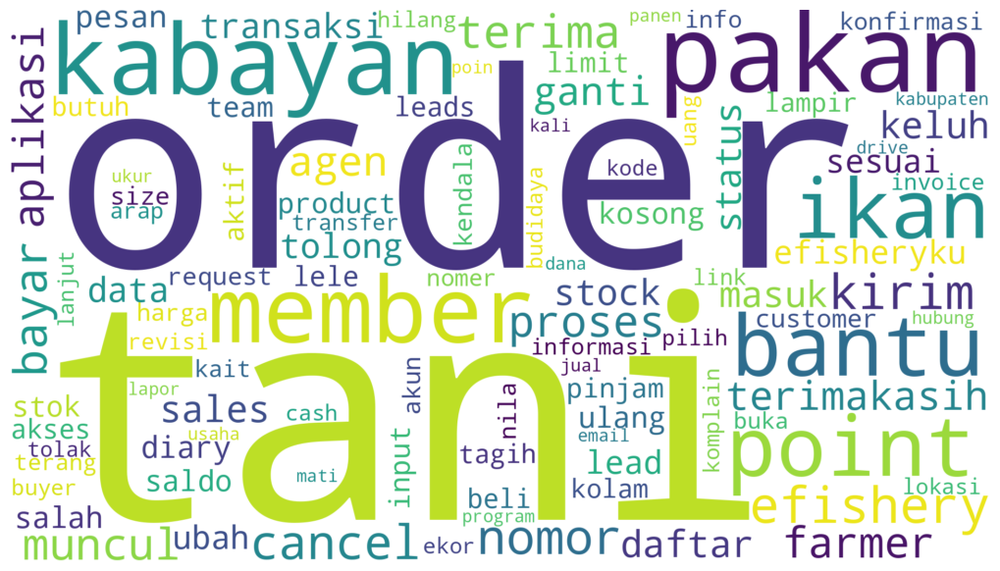

In [30]:
# Create WordCloud Visualization
wordcloud = WordCloud(
    width = 2000,
    height = 1000,
    mask = image_mask,
    contour_color = '#27B796',
    contour_width=1,
    background_color = 'white',
    max_words=100).generate_from_frequencies(frequencies=dict(freq_df_gram1[freq_df_gram1.Frequency > iqr][['Word', 'Frequency']].values))
fig = plt.figure(
    figsize = (10, 15),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [19]:
# Result of Most Important Word
freq_df_gram1[freq_df_gram1.Frequency > iqr][['Word', 'Frequency']].sort_values(by='Frequency', ascending=False)

,Word,Frequency
10741,tani,4680
7608,order,3675
7721,pakan,2564
4918,kabayan,2049
6462,member,1783
...,...,...
5518,komplain,242
1445,budidaya,236
11187,tolak,235
11400,uang,232


In [20]:
# N-Gram 2
freq_df_gram2 = word_frequencies(dataset, 'description', 'n_gram2', 2)

In [21]:
freq_df_gram2.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
31446,member member,900,n_gram2
7904,cancel order,691,n_gram2
31429,member keluh,564,n_gram2
44855,sales diary,504,n_gram2
36016,order pakan,447,n_gram2
...,...,...,...
22093,jurus ikan,1,n_gram2
22094,jurus manajemen,1,n_gram2
22095,jurus palopo,1,n_gram2
22096,jusds nomor,1,n_gram2


In [22]:
# Get IQR frequencies to get top Word
q75, q25 = np.percentile(freq_df_gram2.Frequency.unique(), [75 ,25])
iqr = q75 - q25

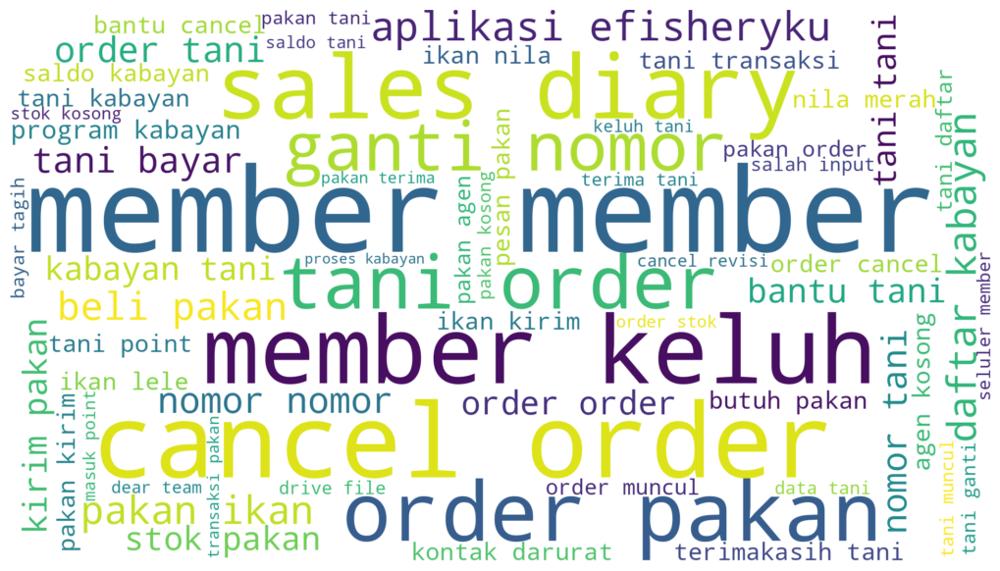

In [31]:
# Create WordCloud Visualization
wordcloud = WordCloud(
    width = 2000,
    height = 1000,
    mask = image_mask,
    contour_color = '#27B796',
    contour_width=1,
    background_color = 'white',
    max_words=100).generate_from_frequencies(frequencies=dict(freq_df_gram2[freq_df_gram2.Frequency > iqr][['Word', 'Frequency']].values))
fig = plt.figure(
    figsize = (10, 15),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [27]:
# Result of Most Important Word 
freq_df_gram2[freq_df_gram2.Frequency > iqr][['Word', 'Frequency']].sort_values(by='Frequency', ascending=False)

,Word,Frequency
31446,member member,900
7904,cancel order,691
31429,member keluh,564
44855,sales diary,504
36016,order pakan,447
...,...,...
36208,order stok,77
37469,pakan terima,77
24255,keluh tani,77
54889,transaksi pakan,77


In [28]:
# N-Gram 3
freq_df_gram3 = word_frequencies(dataset, 'description', 'n_gram3', 3)

In [32]:
# Get IQR frequencies to get top Word
q75, q25 = np.percentile(freq_df_gram3.Frequency.unique(), [75 ,25])
iqr = q75 - q25

In [34]:
# Result of Most Important Word 
freq_df_gram3[freq_df_gram3.Frequency > iqr][['Word', 'Frequency']].sort_values(by='Frequency', ascending=False)

,Word,Frequency
49173,member member keluh,535
49178,member member member,322
81691,tani order pakan,159
6424,bantu cancel order,98
12678,cancel order tani,87
73415,seluler member member,83
49123,member keluh tani,73
26181,ganti nomor tani,67
49092,member keluh pinjam,65
39651,kirim pakan ikan,64


In [10]:
# N-Gram 2
categories_df = []
for category in list(dataset['category'].unique()):
    freq_df = word_frequencies(dataset[dataset['category']== category], 'description', category, 2)
    categories_df.append(freq_df)

# Combine all frequency DataFrames into one
categories_ngram2 = pd.concat(categories_df, ignore_index=True)

In [11]:
categories_ngram2.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
49091,cancel order,518,Cancel Order
41789,member member,379,Kabayan
2750,ganti nomor,269,Aplikasi
25640,sales diary,250,Bug Report
32861,member member,247,Pertanyaan Umum
...,...,...,...
28243,transaksi efresh,1,Bug Report
28244,transaksi famer,1,Bug Report
28245,transaksi farmer,1,Bug Report
28246,transaksi finance,1,Bug Report


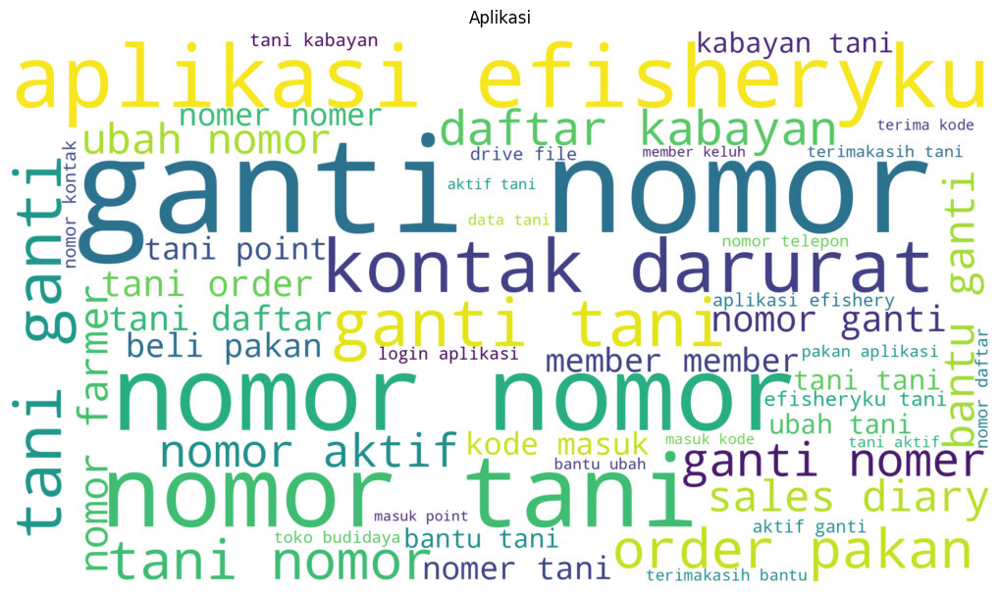

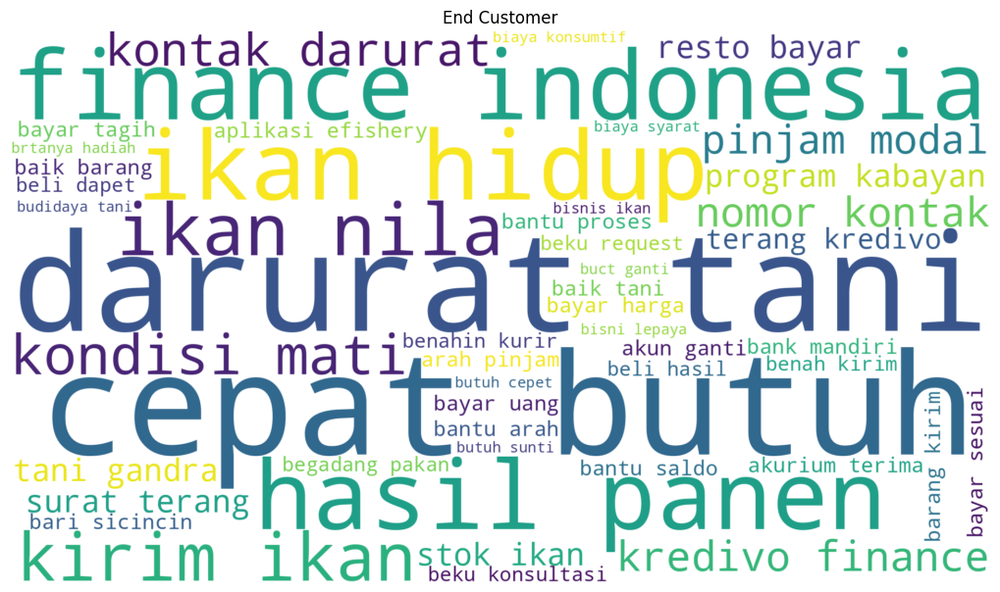

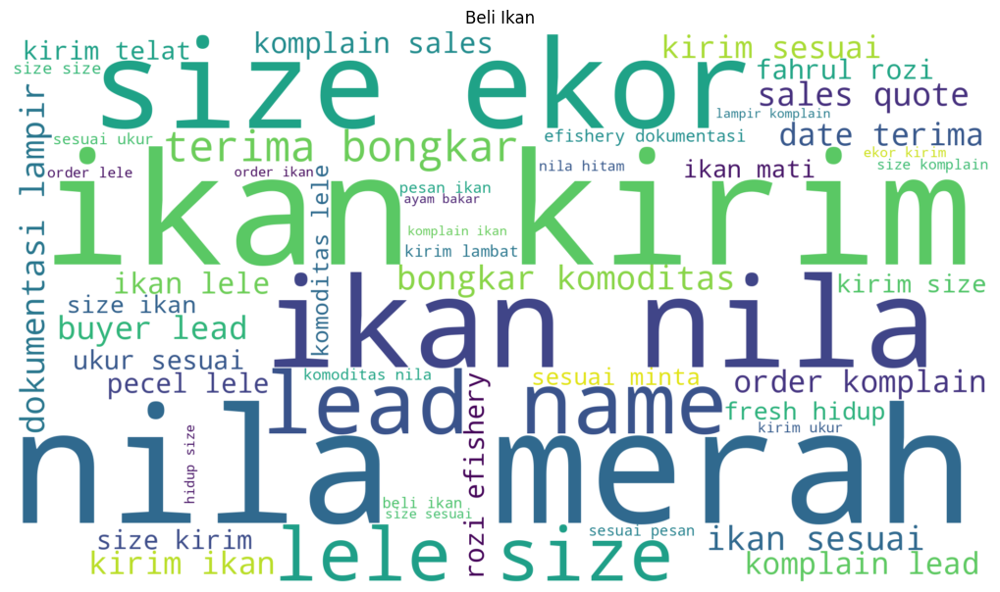

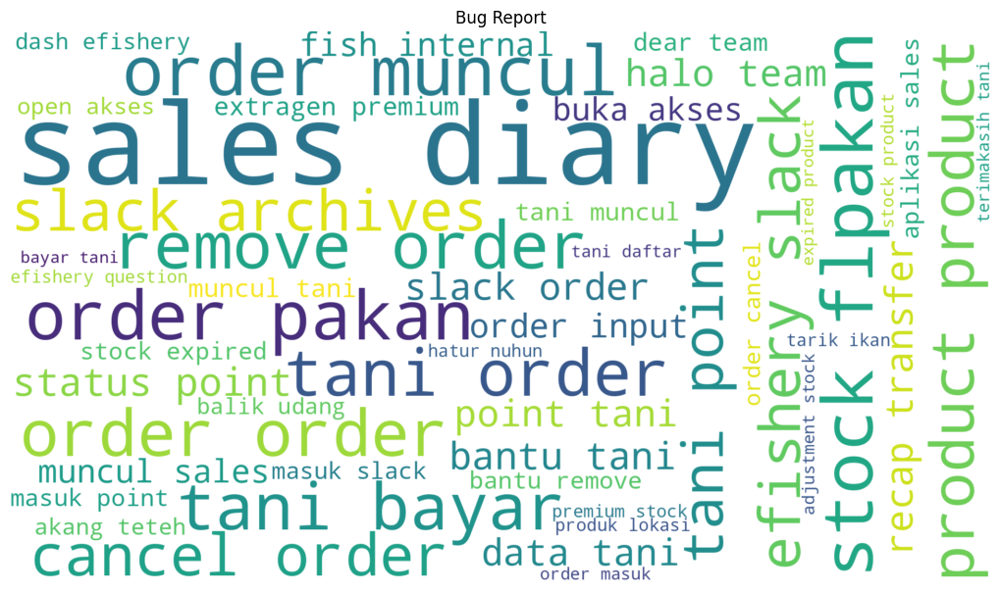

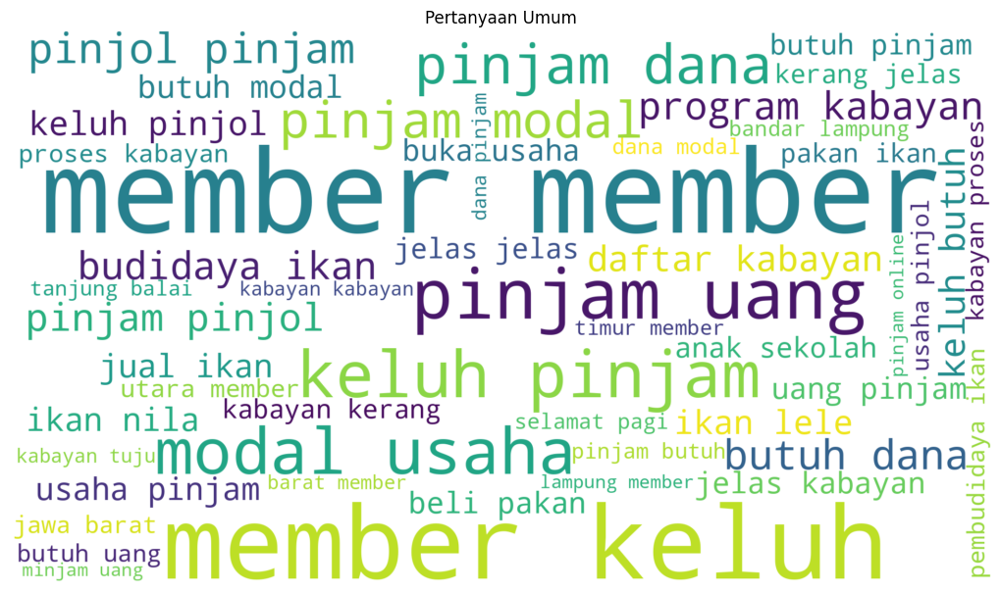

...

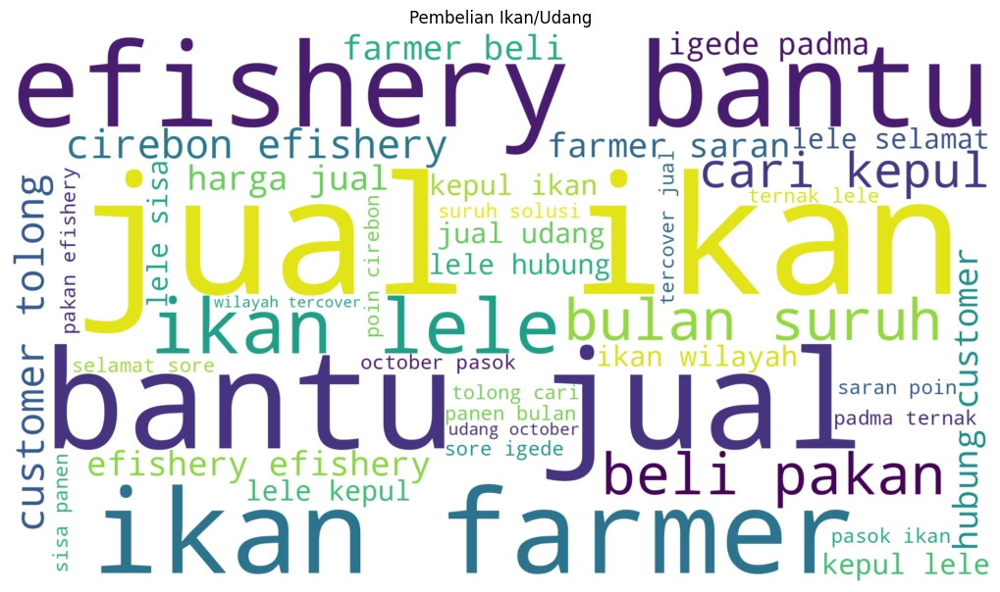

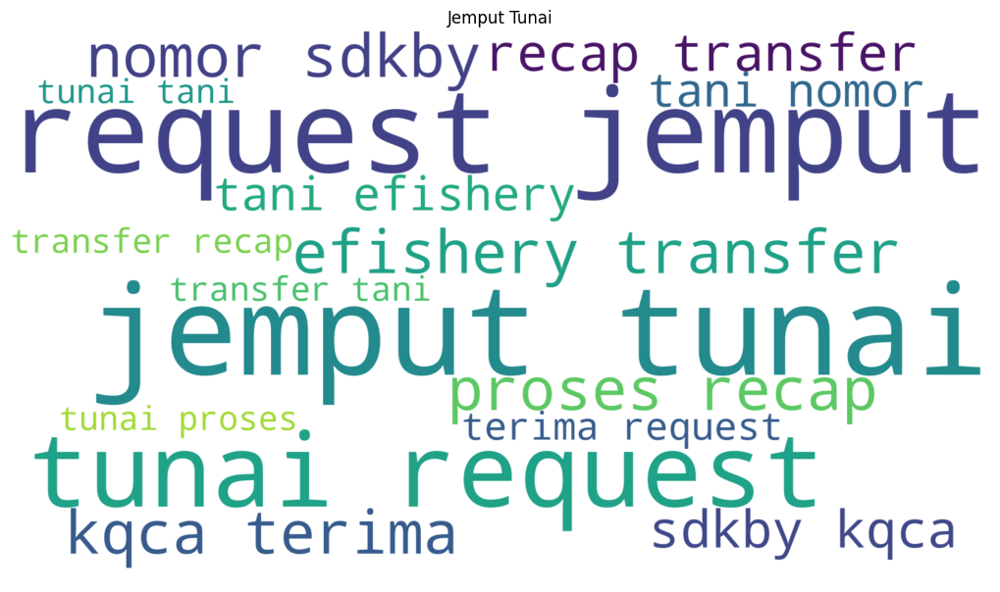

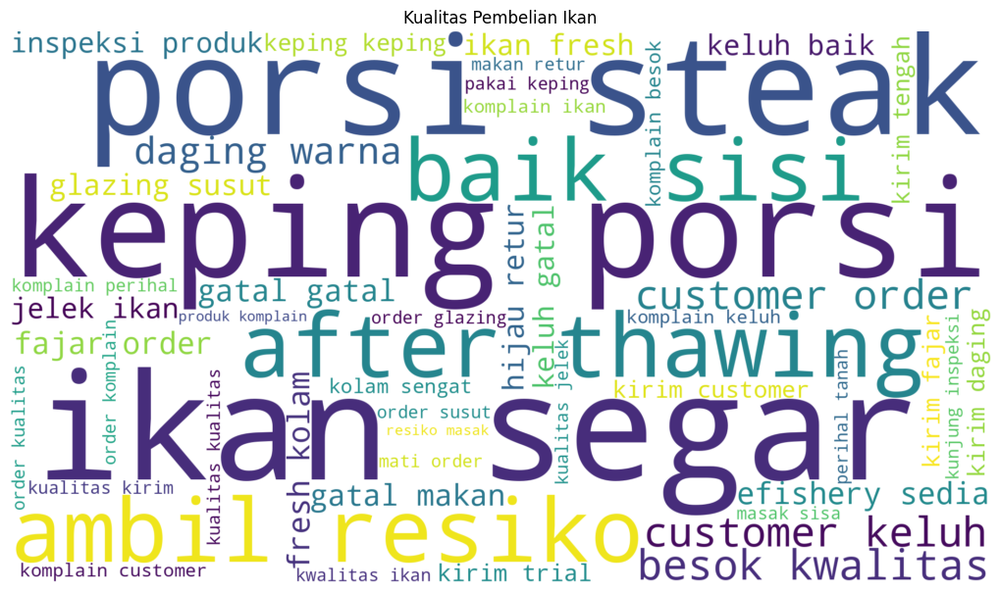

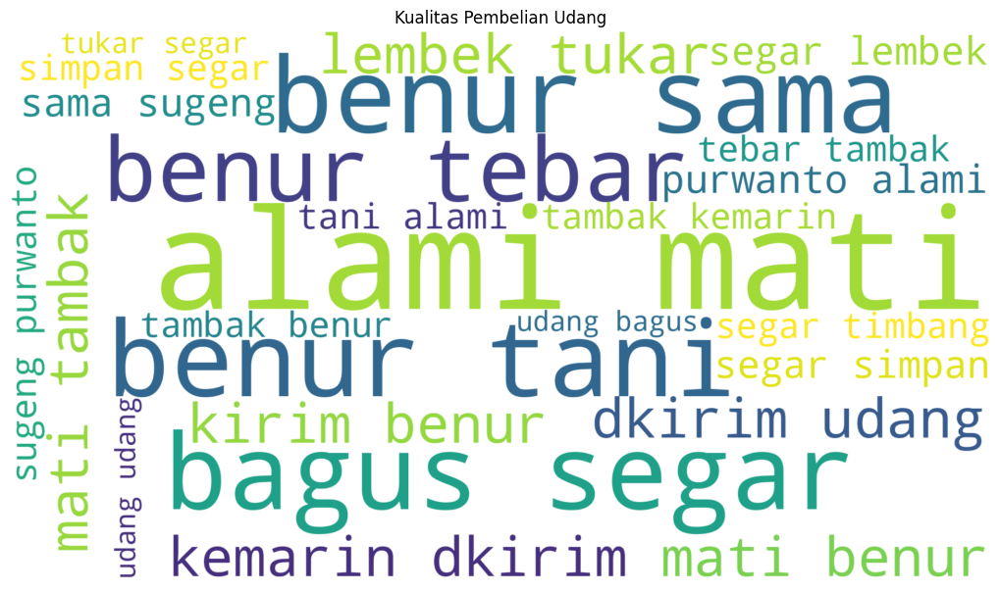

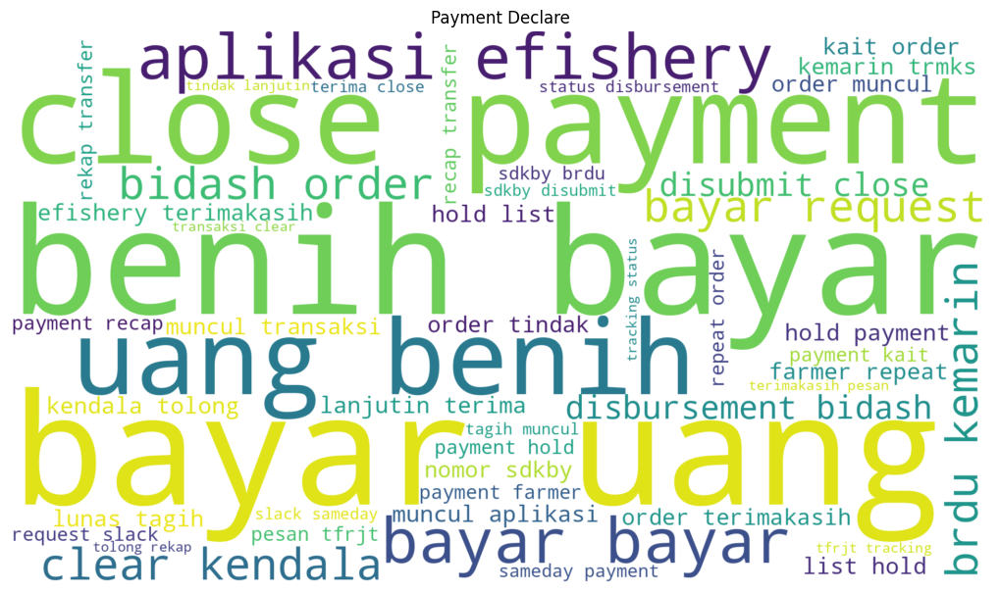

In [14]:
# Create Word Cloud Viz for every type Category
for type in categories_ngram2['Type'].unique():
    text = dict(categories_ngram2[categories_ngram2['Type']== type][['Word','Frequency']].values)

    # Create WordCloud Visualization
    try:
        wordcloud = WordCloud(
        width = 2000,
        height = 1000,
        mask = image_mask,
        contour_color = '#27B796',
        contour_width=1,
        background_color = 'white',
        max_words=50).generate_from_frequencies(frequencies = text)
        fig = plt.figure(figsize = (10, 15),
                 facecolor = 'w',
                 edgecolor = 'w')
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.title(type)
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()
    except:
        continue